In [1]:
import astroprov

from astropy.io import fits
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from astropy.table import Table
from astropy.table import Column
from astropy.io import fits
from astropy.io.ascii import SExtractor
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy import wcs

from astroquery.simbad import Simbad

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from photutils import DAOStarFinder
from photutils import CircularAperture
import os
import subprocess

import image_registration
from image_registration import chi2_shift
from image_registration.fft_tools import shift
import pandas
import collections

from reproject import reproject_interp
from astropy.utils.data import get_pkg_data_filename

In [2]:
imageDirectory = '/data/mj1e16/kepler/cal/'
dirlist = os.listdir(imageDirectory)
dirlist = [x for x in dirlist if x[0] != '.']
#dirlist = sort(dirlist)
imagelist = [imageDirectory+x for x in dirlist]
#print(dirlist)

In [3]:
def correctExtensionOrder(imageName):
    hdu_list = fits.open(imageName)
    extensionOrder = np.zeros(len(hdu_list))
    for channel in range(1,len(hdu_list)):
        hdr = hdu_list[channel].header
        location = hdr['SKYGROUP'] # independant location
        extensionOrder[location] = channel # ordered from 0-84 channel with extension in place of name
    return extensionOrder

In [4]:
def medianImages(image1,image2,channelOrder1,channelOrder2,outfile): # medianing images 2 at a time as they are large
    image_concat = []
    medianlist = []
    hdu_list_1 = fits.open(image1)
    hdu_list_2 = fits.open(image2)

    for channel in range(1,len(channelOrder1)):
        chanNo1 = int(channelOrder1[channel])
        chanNo2 = int(channelOrder2[channel])
                
        im1 = hdu_list_1[chanNo1].data
        im2 = hdu_list_2[chanNo2].data
        
        hdu1 = fits.open(get_pkg_data_filename(image1))[chanNo1]
        hdu2 = fits.open(get_pkg_data_filename(image2))[chanNo2]
        
        try:
            im1_aligned_to_im2, footprint = reproject_interp(hdu1,hdu2.header)
        except:
            im1_aligned_to_im2 = im2
            
        medianImage = np.median([im2,im1_aligned_to_im2],axis=0)
        medianImage = np.absolute(medianImage)
        
        hdu = fits.PrimaryHDU(medianImage)
        hdu.writeto(outfile+'_{}.fits'.format(channel), clobber=True)
        medianlist.append(outfile+'_{}.fits'.format(channel))
    return outfile

In [5]:
def reMedian(median,image2,channel,channelOrder2,outfile): # medianing images 2 at a time as they are large
    
    image_concat = []
    hdu_list_1 = fits.open(median)
    hdu_list_2 = fits.open(image2)
    
    chanNo2 = int(channelOrder2[channel])
    
    hdu1 = fits.open(get_pkg_data_filename(median))[0]
    hdu2 = fits.open(get_pkg_data_filename(image2))[chanNo2]
    
    im1 = hdu_list_1[0].data
    im2 = hdu_list_2[chanNo2].data

    try:
        im1_aligned_to_im2, footprint = reproject_interp(hdu1,hdu2.header)
    except:
        im1_aligned_to_im2 = im1
        
    medianImage = np.median([im2,im1_aligned_to_im2],axis=0)
    medianImage = np.absolute(medianImage)

#     fig, ax = plt.subplots(figsize=(10, 10))
#     norm = ImageNormalize(stretch=SqrtStretch())
#     ax.imshow(medianImage, cmap='Greys',norm=LogNorm())
#     plt.show()
    
    hdu = fits.PrimaryHDU(medianImage)
    hdu.writeto(outfile, clobber=True)
    
    return outfile

In [6]:
def findLowerMagLimit(imagename,cataloguename,magAbove=3,sextractoryDir='/home/mj1e16/sextractor/sextractor-master/config/'):
    os.chdir(sextractoryDir)
    subprocess.call(['sex',imagename])
    assoc = Table.read(cataloguename,format='ascii.sextractor')
    
    print(len(assoc))
    mags = assoc['MAG_BEST'] 
    mags = [x for x in mags if x < 95]
    
    plt.hist(mags,bins='auto')
    plt.show()
    
    minMag = max(mags)
    magLimit = minMag - magAbove
    
    return magLimit

In [7]:
def sextractorTransientSearch(imagename,cataloguename,lowerMag,sextractoryDir='/home/mj1e16/sextractor/sextractor-master/config/'):
    os.chdir(sextractoryDir)
    print(imagename)
    subprocess.call(['sex',imagename])
    assoc = Table.read(cataloguename,format='ascii.sextractor')

    hdu_list = fits.open(imagename) # open image header
    imagedata = (hdu_list[0].data) 
    
    fig, ax = plt.subplots(figsize=(10, 10))
    positions = (assoc['X_IMAGE'], assoc['Y_IMAGE'])
    apertures = CircularAperture(positions, r=4.)
    norm = ImageNormalize(stretch=SqrtStretch())
    ax.imshow(imagedata, cmap='Greys', origin='lower', vmin=-100,vmax=100)#norm=norm)
    apertures.plot(color='blue', lw=1.5, alpha=0.5)
    #plt.savefig('fits.png',dpi=100)
    plt.show()
    
    df = assoc.to_pandas()
    df.drop(df[df['MAG_BEST'] > lowerMag].index)
    #assoc.drop(assoc[assoc.MAG_BEST > lowerMag].index)
    
    plt.hist(df['MAG_BEST'],bins='auto')
    plt.show()
    
    return df

In [8]:
def queryObjectRegion(outputTable,inCat,imageName,searchRadius=5*u.arcsecond):
    imageCoords = []
    r = searchRadius
    
    if inCat == 'dao':
        xlabel = 'xcentroid'
        ylabel = 'ycentroid'
        label = 'id'
        
    if inCat == 'sex':
        xlabel = 'X_IMAGE'
        ylabel = 'Y_IMAGE'
        label = 'NUMBER'
        
    tableLength = len(outputTable)
    for x in range(tableLength):
        xpos = outputTable[xlabel][x]
        ypos = outputTable[ylabel][x]
        if 20 < ypos < 1040:
            if 12 < xpos < 1110:
                imageCoords.append([xpos,ypos])
                # this may need to change per image but I hope not

    coords = load_wcs_from_file(imageName,imageCoords)
    print(coords)
    customSimbad = Simbad()
    customSimbad.add_votable_fields('ra(d)','dec(d)','otype')
    customSimbad.remove_votable_fields('coordinates')
            
    result_table = Table([['-'],[0],[0],['-'],[0],[0]],names=('MAIN_ID','RA_d','DEC_d','OTYPE','xcentroid','ycentroid'),dtype=('object','float64','float64','object','float64','float64'))

    for x in range(len(imageCoords)):
        try:
            c = SkyCoord(coords[x][0],coords[x][1],frame='icrs',unit='deg')
            rt = customSimbad.query_region(c,radius=r)
            rowlist = []
            for y in range(len(rt[0])):
                rowlist.append(rt[0][y])
            rowlist.append(imageCoords[x][0])
            rowlist.append(imageCoords[x][1])
            result_table.add_row(rowlist)

        except:
            result_table.add_row(['N/A',[0],[0],'Not Found in Simbad',[imageCoords[x][0]],[imageCoords[x][1]]])
    
    
    return result_table

In [9]:
def alterDefault(defaultDir,valList,attributeList):
    
    with open(defaultDir+'/default.sex','r') as f:
        data  = f.read()
    for x in range(len(valList)):
        nameLoc = data.find(attributeList[x]) + len(attributeList[x])
        endLoc = data[nameLoc:].find('#') + nameLoc
        newData = data[:nameLoc] + ' '+str(valList[x])+' ' + data[endLoc:]
        data = newData
    
#     with open(defaultDir+'/default.sex','r') as f:
#         endData = f.read()
#     cname = 'CATALOG_NAME'
#     nameLoc = endData.find(cname) + len(cname)
#     endLoc = data[nameLoc:].find('#') + nameLoc
#     newData = data[:nameLoc] + '' + data[endLoc:]
    
    with open(defaultDir+'/default.sex','w') as f:
        f.write(data)

In [10]:
def load_wcs_from_file(filename,pixCoord):
    # Load the FITS hdulist using astropy.io.fits
    hdulist = fits.open(filename)

    # Parse the WCS keywords in the primary HDU
    w = wcs.WCS(hdulist[0].header)

    # Print out the "name" of the WCS, as defined in the FITS header
    #print(w.wcs.name)

    # Print out all of the settings that were parsed from the header
    w.wcs.print_contents()

    # Three pixel coordinates of interest.
    # Note we've silently assumed a NAXIS=2 image here.
    # Note also that the pixel coordinates are pairs of [X, Y], 
    # and since WCS built from FITS header automatically has
    # origin set to 1, [0, 0] is actually not inside the image.
    pixcrd = np.array(pixCoord, dtype=np.float_)

    # Convert pixel coordinates to world coordinates
    # The second argument is "origin" -- in this case we're declaring we
    # have 1-based (Fortran-like) coordinates.
    world = w.wcs_pix2world(pixcrd, 1)
    #print(world)
    return(world)
#     # Convert the same coordinates back to pixel coordinates.
#     pixcrd2 = w.wcs_world2pix(world, 1)
#     print(pixcrd2)

#     # These should be the same as the original pixel coordinates, modulo
#     # some floating-point error.
#     assert np.max(np.abs(pixcrd - pixcrd2)) < 1e-6




In [11]:
def findObjectOccurences(inputTable,columnName):
    otype = inputTable[columnName]
    otypelist = []
    for x in range(len(otype)):
        otypelist.append(otype[x])
    #print(len(otypelist))
    newotype = set(otypelist)
    counter = collections.Counter(otypelist)
    keys = counter.keys()
    values = counter.values()
    occurenceDict = dict(zip(keys,values))
    od = collections.OrderedDict(sorted(occurenceDict.items()))
    return od

In [12]:
alterDefault('/home/mj1e16/sextractor/sextractor-master/config/',[5,5,64,3],['DETECT_THRESH','DETECT_MINAREA','BACK_SIZE','BACK_FILTERSIZE'])

In [12]:
extensionOrders = []
for image in imagelist:
    extensionOrders.append(correctExtensionOrder(image))

In [61]:
medianDir = '/data/mj1e16/kepler/newDiff/'
medians = os.listdir(medianDir)
medians = [x for x in medians if x[0] != '.']
medians.sort()

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 5519 results
  r = func(a, **kwargs)
/home/mj1e16/.local/lib/python2.7/site-packages/matplotlib/colors.py:929: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


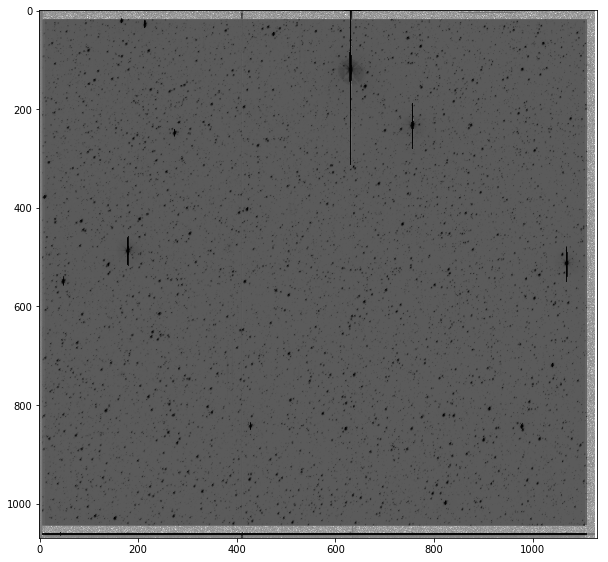

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 6340 results
  r = func(a, **kwargs)


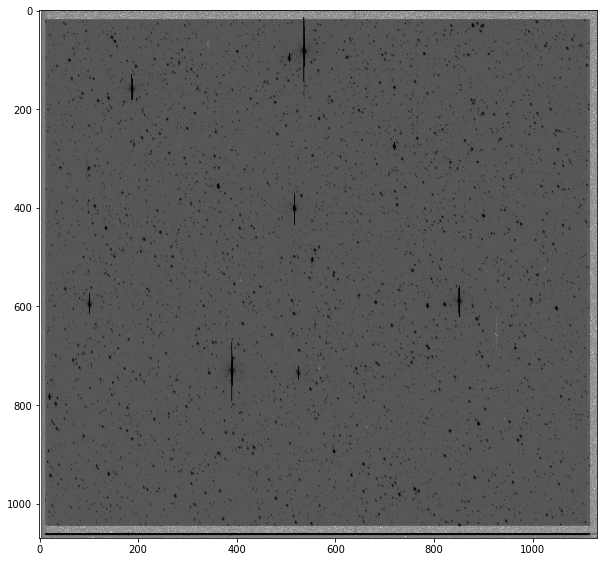

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 6536 results
  r = func(a, **kwargs)


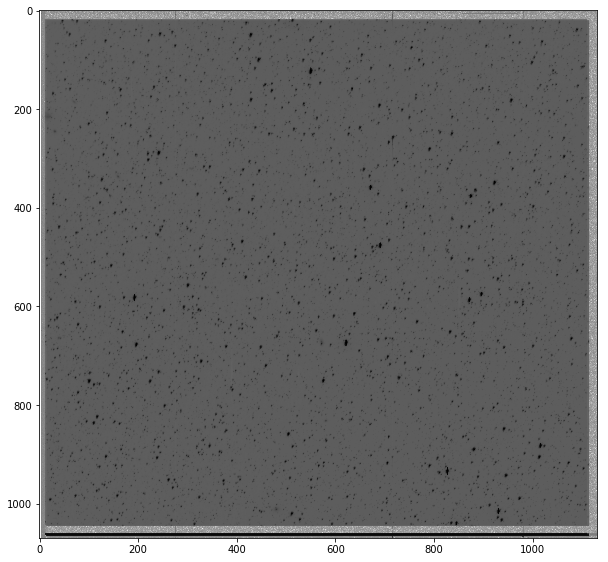

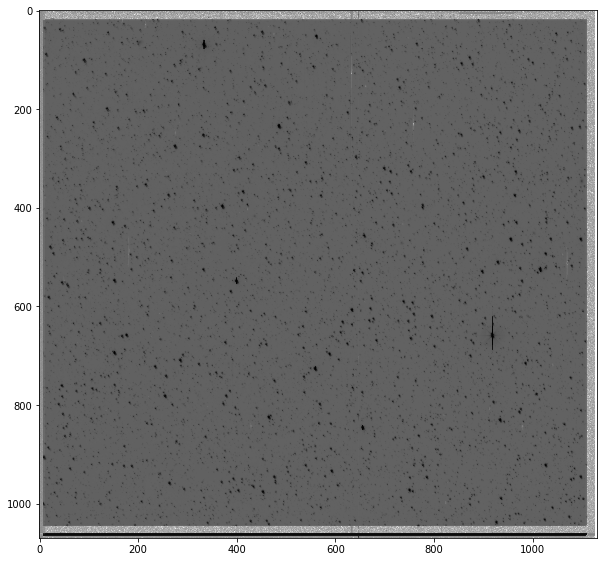

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 5988 results
  r = func(a, **kwargs)


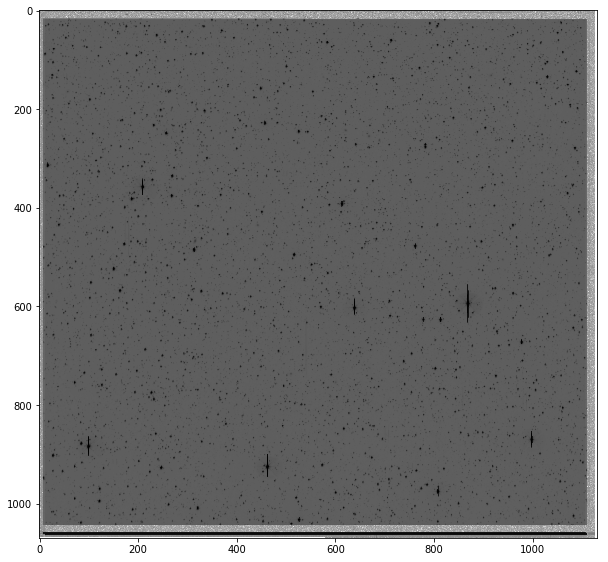

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 4991 results
  r = func(a, **kwargs)


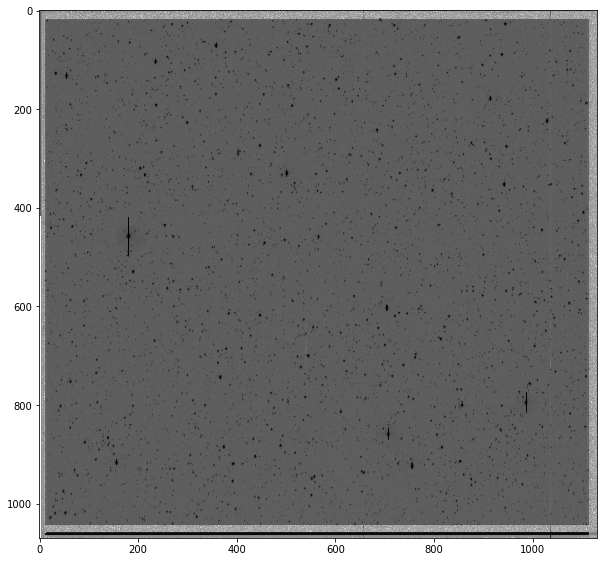

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 4528 results
  r = func(a, **kwargs)


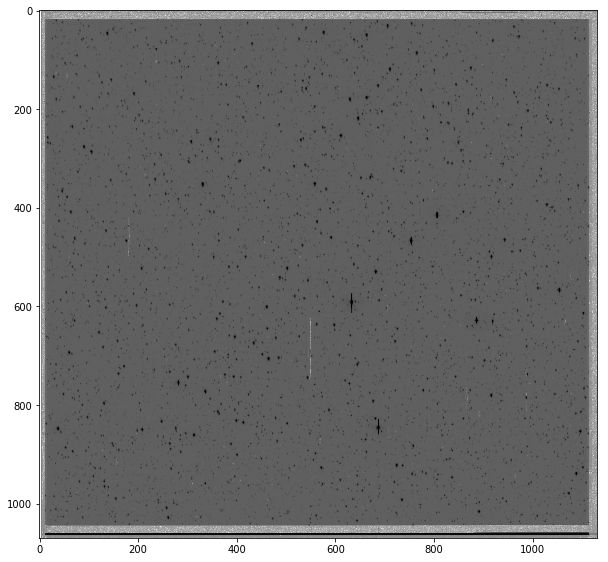

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 5408 results
  r = func(a, **kwargs)


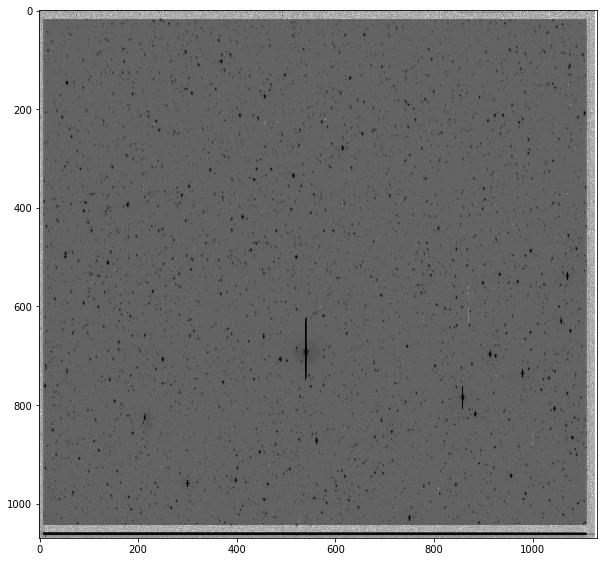

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 6165 results
  r = func(a, **kwargs)


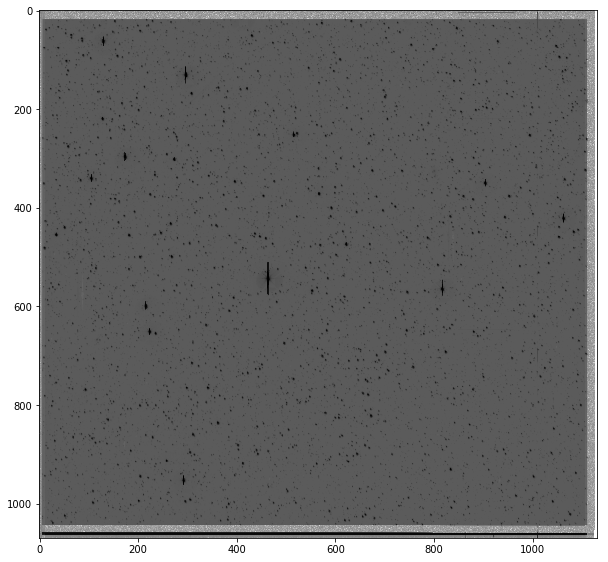

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 5635 results
  r = func(a, **kwargs)


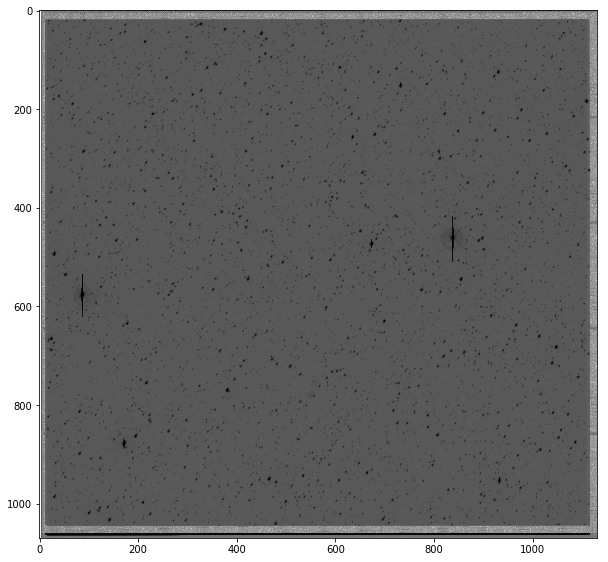

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 10067 results
  r = func(a, **kwargs)


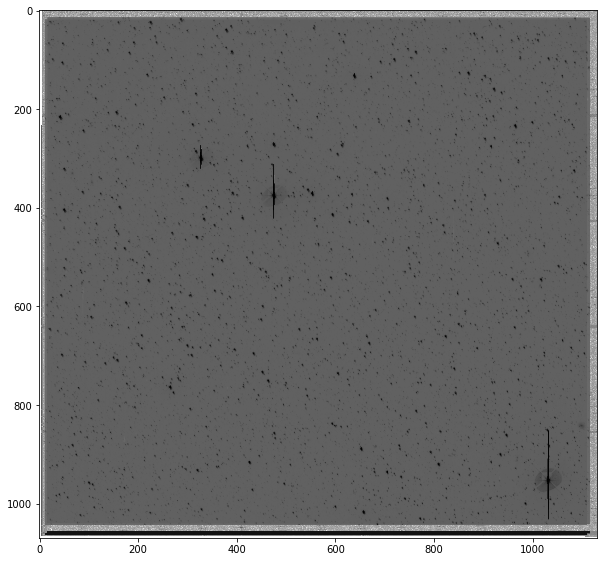

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 9611 results
  r = func(a, **kwargs)


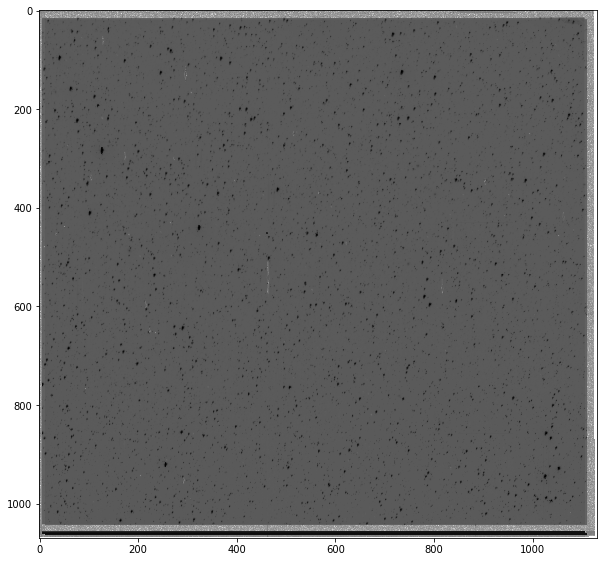

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 6884 results
  r = func(a, **kwargs)


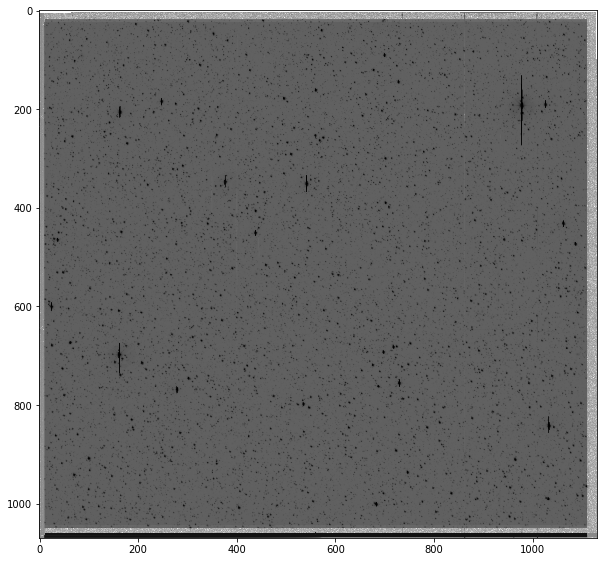

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 5634 results
  r = func(a, **kwargs)


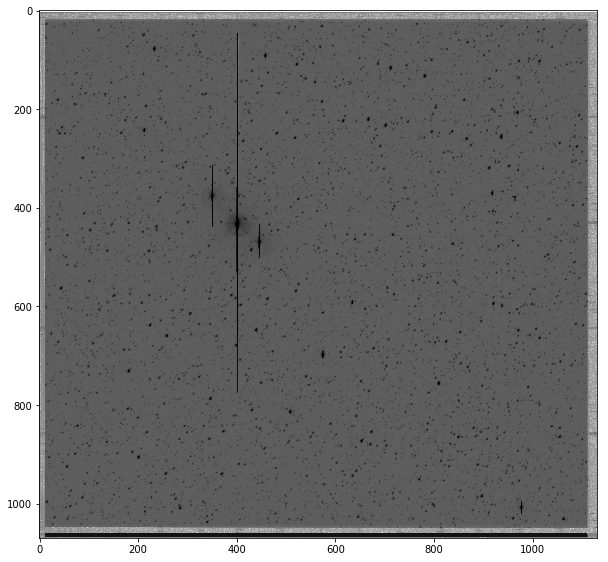

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 1105 results
  r = func(a, **kwargs)


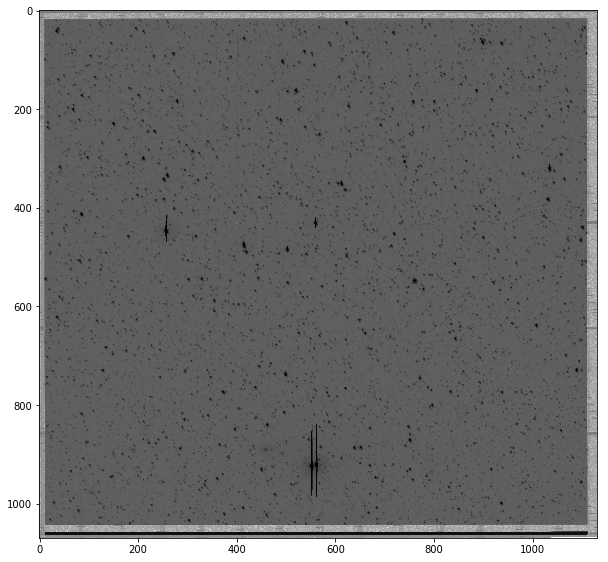

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 4404 results
  r = func(a, **kwargs)


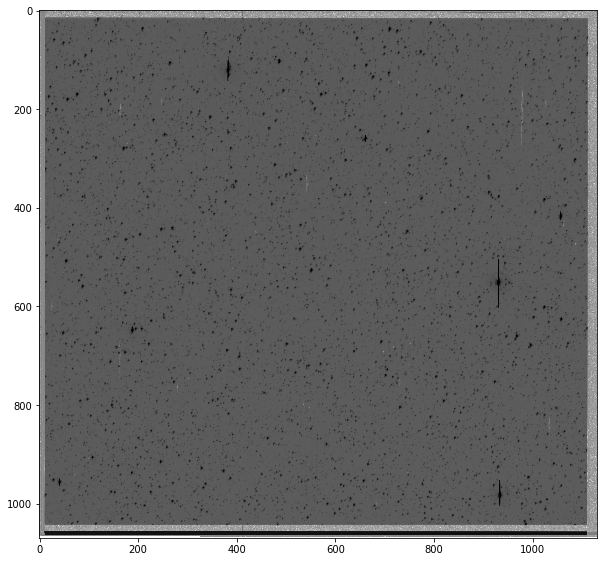

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 7546 results
  r = func(a, **kwargs)


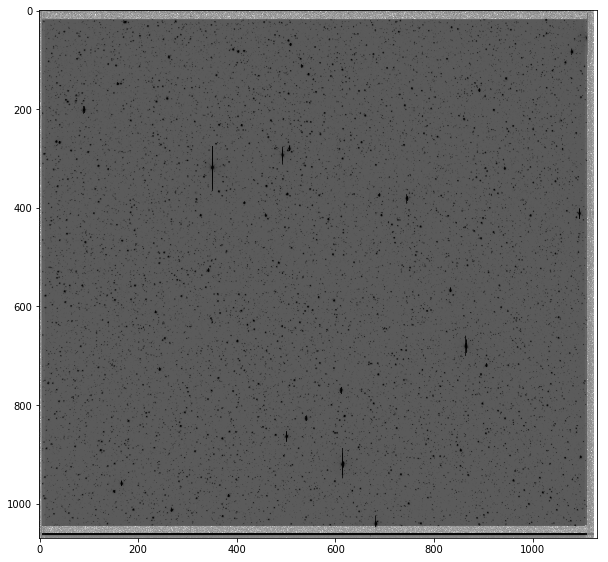

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 6477 results
  r = func(a, **kwargs)


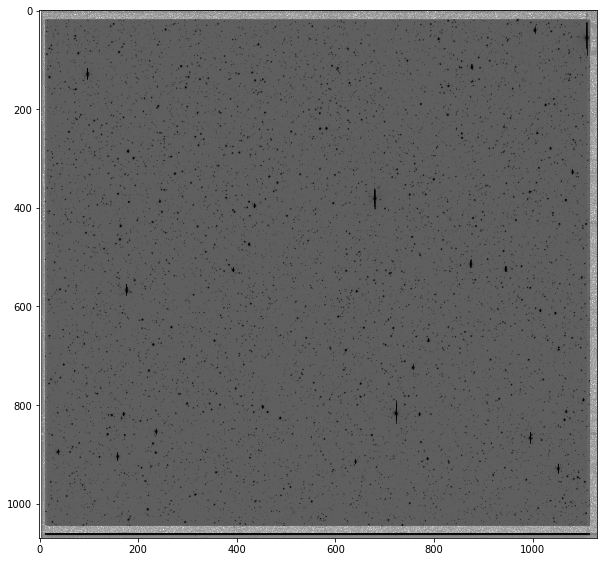

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 5745 results
  r = func(a, **kwargs)


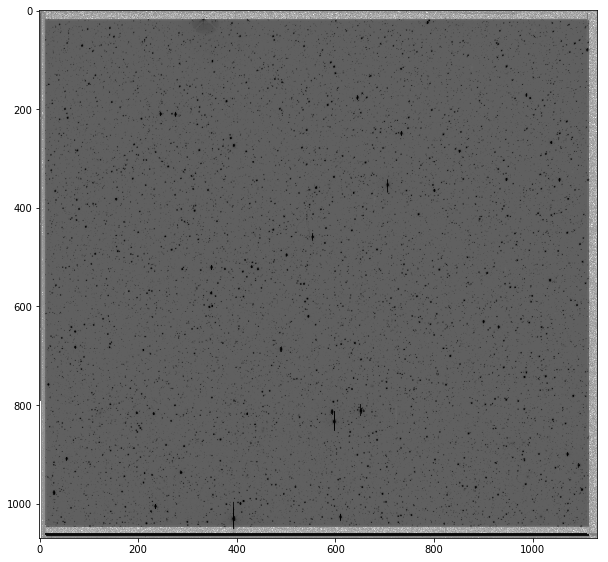

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 6519 results
  r = func(a, **kwargs)


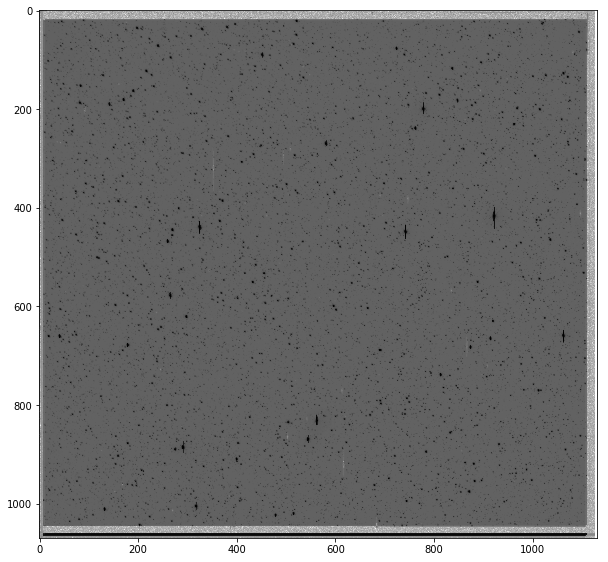

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 6323 results
  r = func(a, **kwargs)


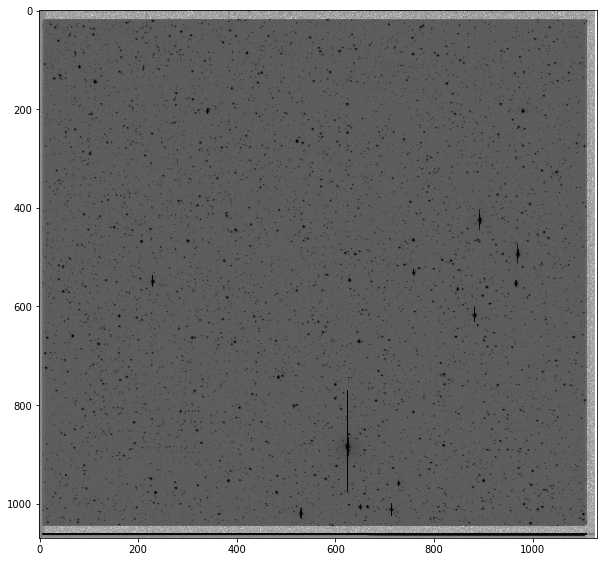

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 6101 results
  r = func(a, **kwargs)


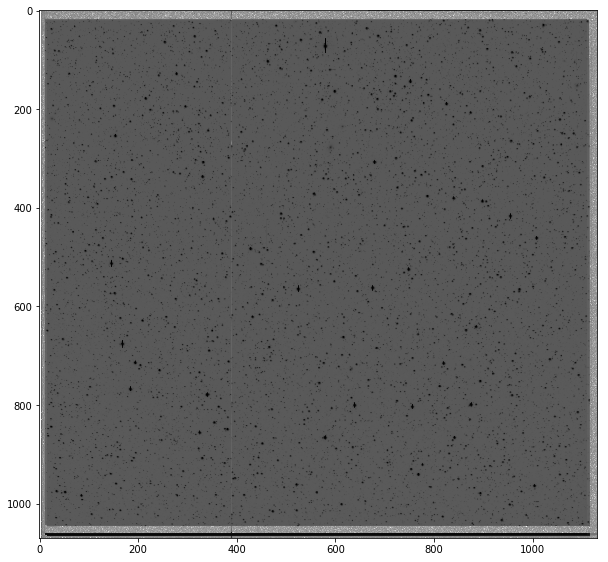

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 4339 results
  r = func(a, **kwargs)


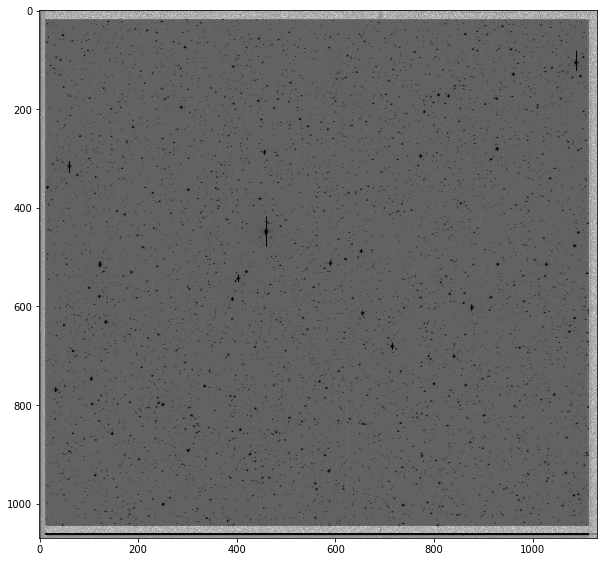

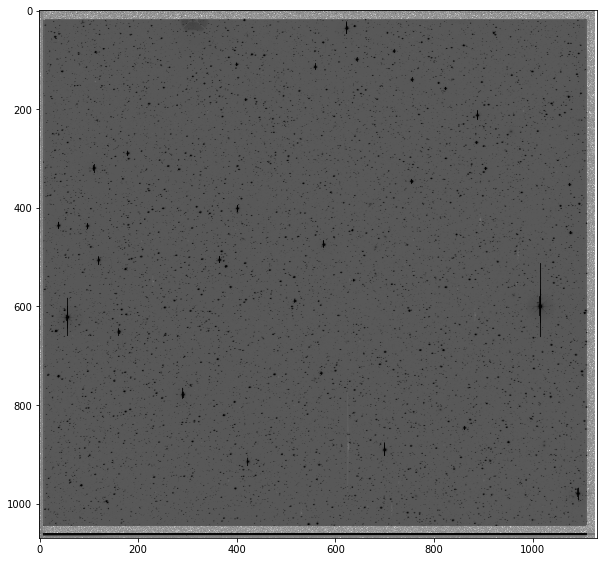

KeyboardInterrupt: 

In [59]:

# medianImages(imagelist[0],imagelist[1],extensionOrders[0],extensionOrders[1],'/data/mj1e16/kepler/newDiff/median')

# for imageNo in range(2,3): #len(imagelist)):
#     for channel in range(1,2): #len(medians)):
#         medianFile = medianDir+'median_{}.fits'.format(channel)
#         reMedian(medianFile,imagelist[imageNo],channel,extensionOrders[imageNo],medianFile)
        
# os.chdir('/data/mj1e16/kepler/hotpants-master/')
# for imNo in range(1): #len(imagelist)):
#     for channel in range(1,2): #len(medians)):
#         ccdChannel = int(extensionOrders[imNo][channel])
#         inim = imagelist[imNo]+'[{}]'.format(ccdChannel)
#         tmplim = medianDir+'median_{}.fits'.format(channel)
#         outim = '/data/mj1e16/kepler/properDiff/diff_imNo{}_channel{}.fits'.format(imNo,channel)
#         subprocess.call(['./hotpants','-inim',inim,'-tmplim',tmplim,'-outim',outim,'-v','0'])

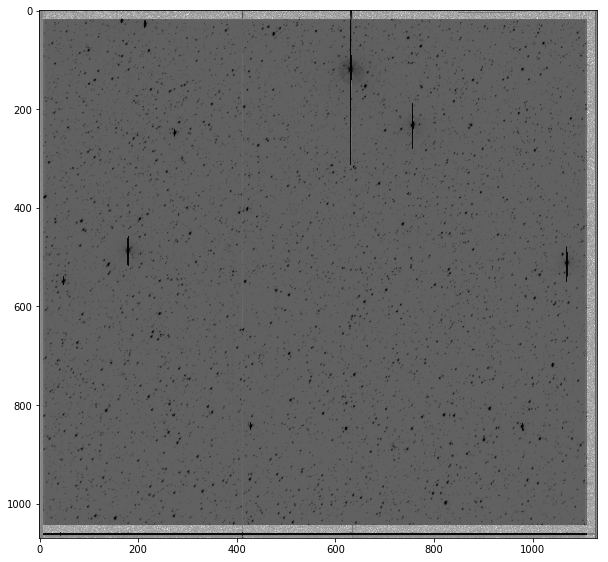

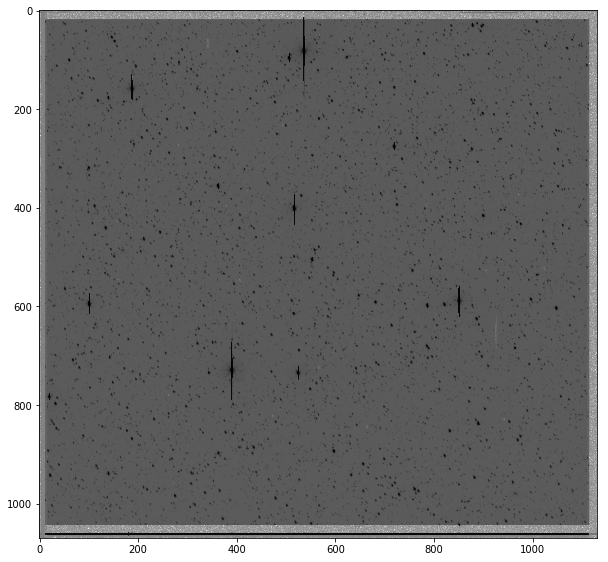

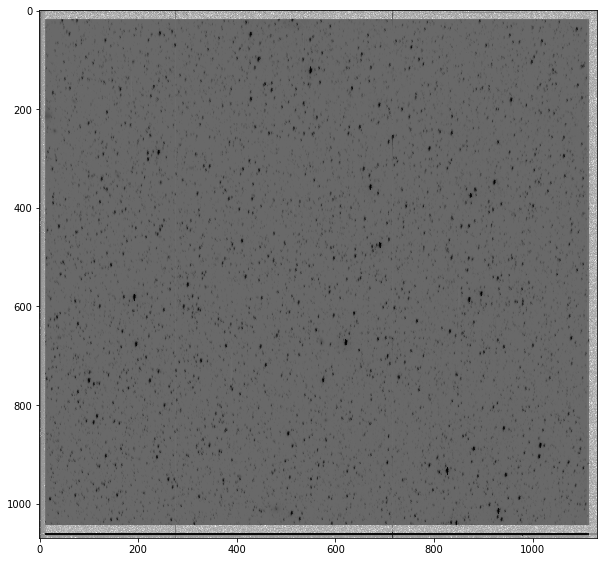

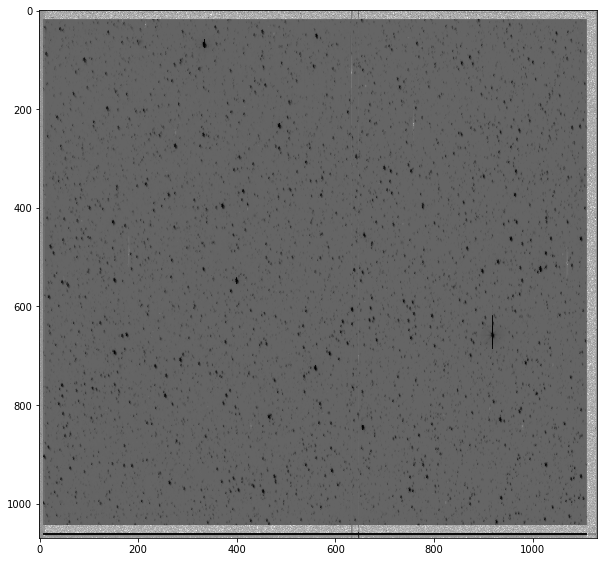

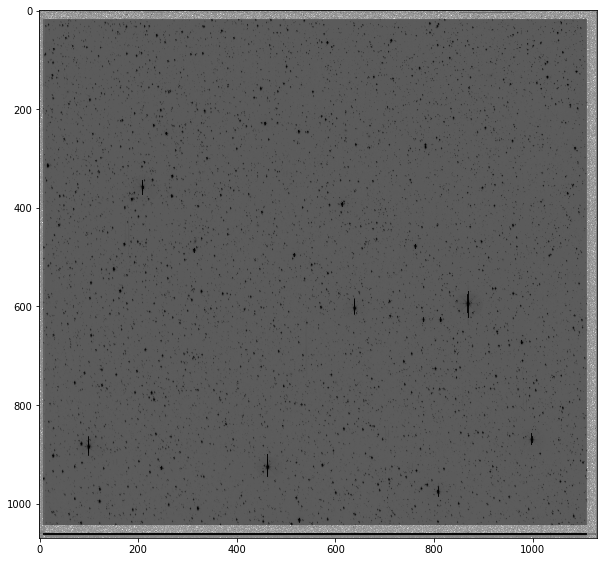

...

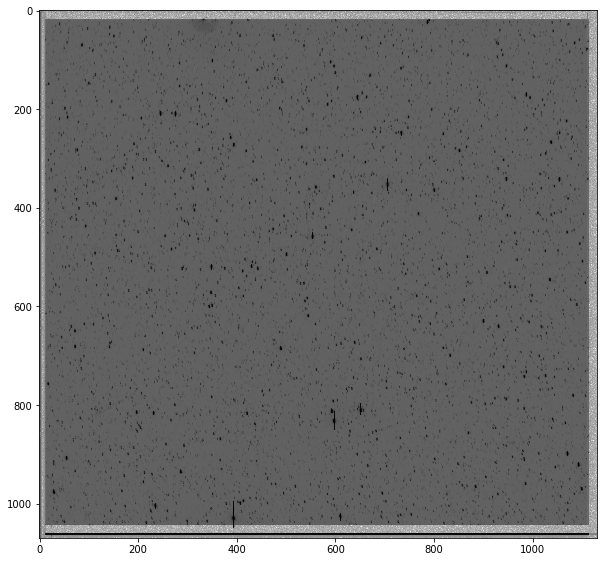

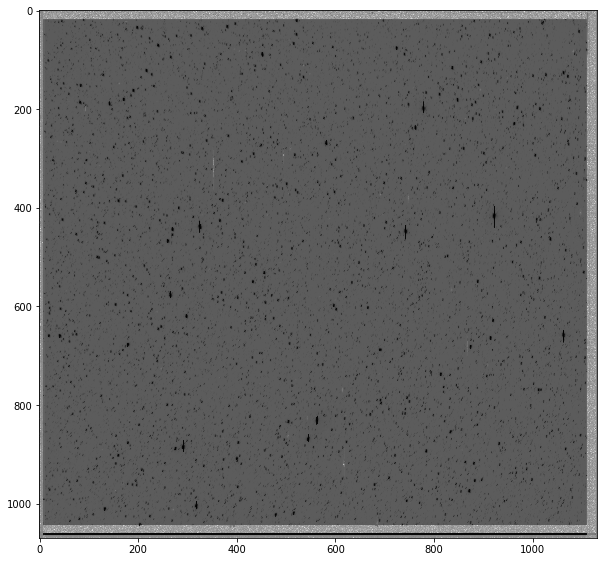

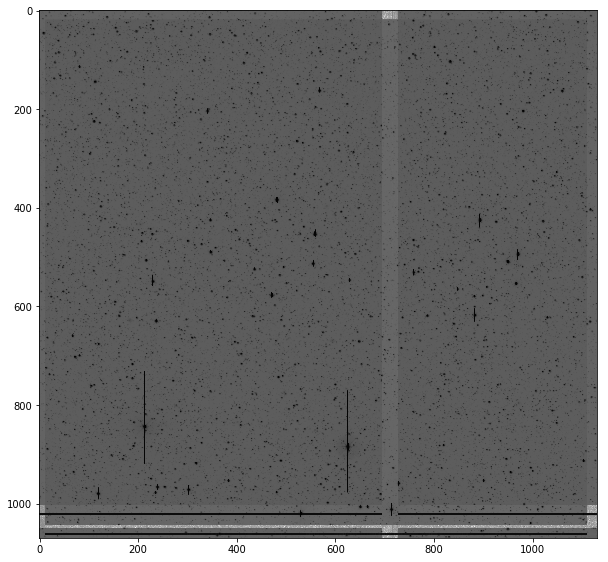

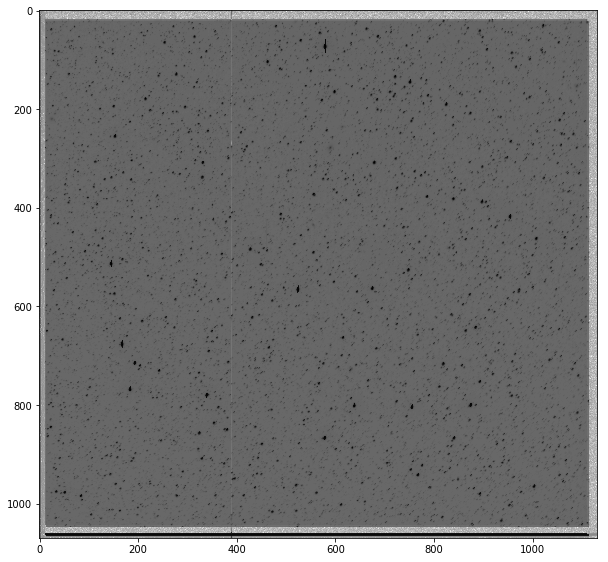

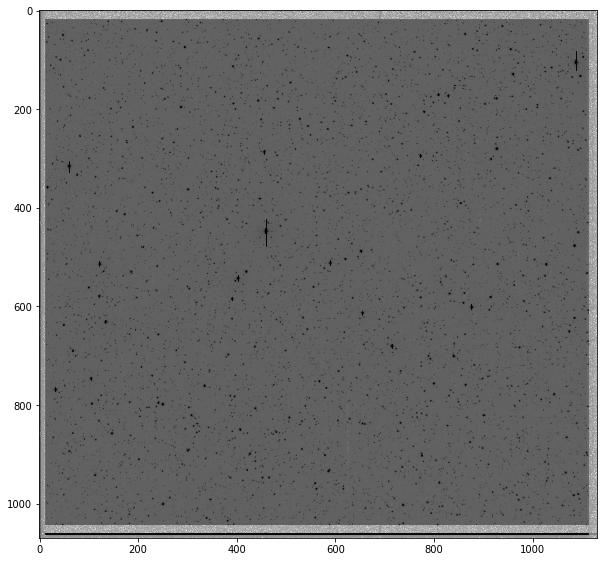

ValueError: Shape of array too small to calculate a numerical gradient, at least (edge_order + 1) elements are required.

In [62]:

# medianImages(imagelist[0],imagelist[1],extensionOrders[0],extensionOrders[1],'/data/mj1e16/kepler/newDiff/median')

# for imageNo in range(2,3): #len(imagelist)):
#     for channel in range(1,2): #len(medians)):
#         medianFile = medianDir+'median_{}.fits'.format(channel)
#         reMedian(medianFile,imagelist[imageNo],channel,extensionOrders[imageNo],medianFile)
        
# os.chdir('/data/mj1e16/kepler/hotpants-master/')
# for imNo in range(1): #len(imagelist)):
#     for channel in range(1,2): #len(medians)):
#         ccdChannel = int(extensionOrders[imNo][channel])
#         inim = imagelist[imNo]+'[{}]'.format(ccdChannel)
#         tmplim = medianDir+'median_{}.fits'.format(channel)
#         outim = '/data/mj1e16/kepler/properDiff/diff_imNo{}_channel{}.fits'.format(imNo,channel)
#         subprocess.call(['./hotpants','-inim',inim,'-tmplim',tmplim,'-outim',outim,'-v','0'])

In [33]:
def medianImages(image1,image2,channelOrder1,channelOrder2,outfile): # medianing images 2 at a time as they are large
    image_concat = []
    medianlist = []
    hdu_list_1 = fits.open(image1)
    hdu_list_2 = fits.open(image2)

    for channel in range(59,len(channelOrder1)):
        chanNo1 = int(channelOrder1[channel])
        chanNo2 = int(channelOrder2[channel])
        
        print(channel)
        print(chanNo1)
        print(chanNo2)
        im1 = hdu_list_1[chanNo1].data
        im2 = hdu_list_2[chanNo2].data
        
        hdu1 = fits.open(get_pkg_data_filename(image1))[chanNo1]
        hdu2 = fits.open(get_pkg_data_filename(image2))[chanNo2]
        
#         print(hdu1.header)
#         print('222222222222222222222222222')
#         print(hdu2.header)
        
#         yoff,xoff = image_registration.cross_correlation_shifts(im1,im2)
#         im1_aligned_to_im2 = np.roll(np.roll(im1,int(yoff),1),int(xoff),0)

        im1_aligned_to_im2, footprint = reproject_interp(hdu1,hdu2.header)


        medianImage = np.median([im2,im1_aligned_to_im2],axis=0)
        medianImage = np.absolute(medianImage)
        
#         fig, ax = plt.subplots(figsize=(10, 10))
#         norm = ImageNormalize(stretch=SqrtStretch())
#         ax.imshow(medianImage, cmap='Greys',norm=LogNorm())
#         plt.show()
        
        hdu = fits.PrimaryHDU(medianImage)
        hdu.writeto(outfile+'_{}.fits'.format(channel), clobber=True)
        medianlist.append(outfile+'_{}.fits'.format(channel))
    return outfile

In [ ]:
medianImages(imagelist[0],imagelist[1],extensionOrders[0],extensionOrders[1],'/data/mj1e16/kepler/newDiff/median')

In [62]:
medians

['median_1.fits',
 'median_10.fits',
 'median_11.fits',
 'median_12.fits',
 'median_13.fits',
 'median_14.fits',
 'median_15.fits',
 'median_16.fits',
 'median_17.fits',
 'median_18.fits',
 'median_19.fits',
 'median_2.fits',
 'median_20.fits',
 'median_21.fits',
 'median_22.fits',
 'median_23.fits',
 'median_24.fits',
 'median_25.fits',
 'median_26.fits',
 'median_27.fits',
 'median_28.fits',
 'median_29.fits',
 'median_3.fits',
 'median_30.fits',
 'median_31.fits',
 'median_32.fits',
 'median_33.fits',
 'median_34.fits',
 'median_35.fits',
 'median_36.fits',
 'median_37.fits',
 'median_38.fits',
 'median_39.fits',
 'median_4.fits',
 'median_40.fits',
 'median_41.fits',
 'median_42.fits',
 'median_43.fits',
 'median_44.fits',
 'median_45.fits',
 'median_46.fits',
 'median_47.fits',
 'median_48.fits',
 'median_49.fits',
 'median_5.fits',
 'median_50.fits',
 'median_51.fits',
 'median_52.fits',
 'median_53.fits',
 'median_54.fits',
 'median_55.fits',
 'median_56.fits',
 'median_57.fits'

In [ ]:
for imageNo in range(2,len(imagelist)):
    for channel in range(1,len(medians)):
        medianFile = medianDir+'median_{}.fits'.format(channel)
        reMedian(medianFile,imagelist[imageNo],channel,extensionOrders[imageNo],medianFile)
        
os.chdir('/data/mj1e16/kepler/hotpants-master/')
for imNo in range(len(imagelist)):
    for channel in range(1,len(medians)):
        ccdChannel = int(extensionOrders[imNo][channel])
        inim = imagelist[imNo]+'[{}]'.format(ccdChannel)
        tmplim = medianDir+'median_{}.fits'.format(channel)
        outim = '/data/mj1e16/kepler/registerDiff/diff_imNo{}_channel{}.fits'.format(imNo,channel)
        subprocess.call(['./hotpants','-inim',inim,'-tmplim',tmplim,'-outim',outim,'-v','0'])

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 6660 results
  r = func(a, **kwargs)
/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 8542 results
  r = func(a, **kwargs)
/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 8184 results
  r = func(a, **kwargs)
/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 6120 results
  r = func(a, **kwargs)
/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 4778 results
  r = func(a, **kwargs)
/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in medi

/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 22920 results
  r = func(a, **kwargs)
/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 13056 results
  r = func(a, **kwargs)
/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 13584 results
  r = func(a, **kwargs)
/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 21676 results
  r = func(a, **kwargs)
/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in median for 14122 results
  r = func(a, **kwargs)
/home/mj1e16/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:4011: RuntimeWarning: Invalid value encountered in

In [ ]:
lowerMagLims = []
for channel in range(1,len(medians)):
    lowerMagLims.append(findLowerMagLimit(medianDir+'median_{}.fits'.format(channel),'test.cat'))
    
lowMagLim = np.mean(lowerMagLims)
print(lowMagLim)

In [ ]:
newlist = [0] # correct as median 0 does not exist
newlist.extend(lowerMagLims)

In [ ]:
objectsFound = []

for imNo in range(len(imagelist)):
    for channel in range(1,2): #len(medians)):
        magLim = lowerMagLims[channel]
        diffImName = '/data/mj1e16/kepler/registerDiff/diff_imNo{}_channel{}.fits'.format(imNo,channel)
        brightTrans = sextractorTransientSearch(diffImName,'test.cat',magLim)
        if len(brightTrans) > 0:
            result_table = queryObjectRegion(brightTrans,'sex',diffImName)
            objectsFound.append(findObjectOccurences(result_table,'OTYPE'))
            

In [31]:
# objectsFound = []
# objectsFound.append(findObjectOccurences(result_table,'OTYPE'))
# print(objectsFound)

[OrderedDict([('-', 1), ('Not Found in Simbad', 2903), ('RotV*', 8), ('Star', 22)])]


/data/mj1e16/kepler/properDiff/diff_imNo0_channel2.fits


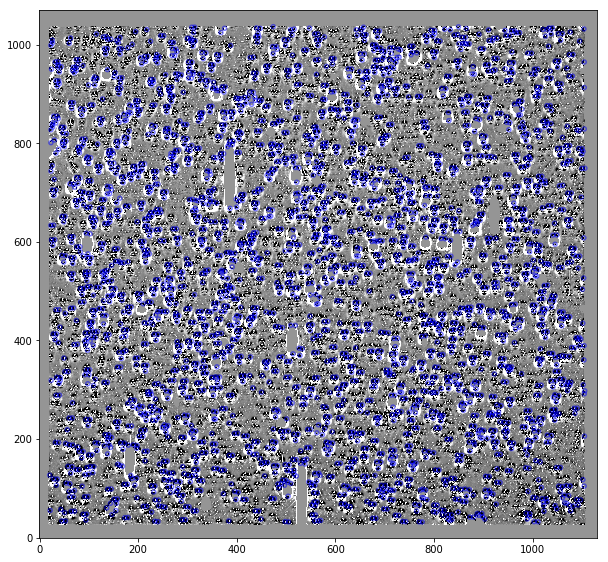

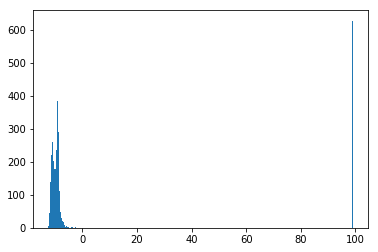

In [19]:
imNo = 0
channel = 2
magLim = -9
diffImName = '/data/mj1e16/kepler/properDiff/diff_imNo{}_channel{}.fits'.format(imNo,channel)
brightTrans = sextractorTransientSearch(diffImName,'test.cat',magLim)

In [26]:
print(result_table)

MAIN_ID RA_d DEC_d        OTYPE        xcentroid ycentroid
------- ---- ----- ------------------- --------- ---------
      -  0.0   0.0                   -       0.0       0.0
    N/A  0.0   0.0 Not Found in Simbad  647.0416   99.8364
    N/A  0.0   0.0 Not Found in Simbad  646.1707   53.7858
    N/A  0.0   0.0 Not Found in Simbad  646.3025  195.1901
    N/A  0.0   0.0 Not Found in Simbad   628.134  273.2393
    N/A  0.0   0.0 Not Found in Simbad  624.6146   48.5795
    N/A  0.0   0.0 Not Found in Simbad  625.9633   94.4075
    N/A  0.0   0.0 Not Found in Simbad  230.5236   32.9999
    N/A  0.0   0.0 Not Found in Simbad  209.9736   30.7232
    N/A  0.0   0.0 Not Found in Simbad  163.3403   32.4995
    ...  ...   ...                 ...       ...       ...
    N/A  0.0   0.0 Not Found in Simbad  210.0089 1032.3317
    N/A  0.0   0.0 Not Found in Simbad 1003.7277 1031.1488
    N/A  0.0   0.0 Not Found in Simbad 1108.3148 1033.9186
    N/A  0.0   0.0 Not Found in Simbad  439.3037 1033.90

In [25]:
result_table = queryObjectRegion(brightTrans,'sex',diffImName)

[[ 291.14154333   50.21634032]
 [ 291.18556745   50.17398335]
 [ 291.05383599   50.30551075]
 ..., 
 [ 290.20704398   51.05663052]
 [ 290.35569023   51.12367809]
 [ 290.64836415   51.2440234 ]]


/home/mj1e16/miniconda2/envs/astroconda/lib/python2.7/site-packages/astroquery/simbad/core.py:136: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '19:22:23.483 +49:54:08.4485': No astronomical object found :
  (error.line, error.msg))
/home/mj1e16/miniconda2/envs/astroconda/lib/python2.7/site-packages/astroquery/simbad/core.py:136: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '19:24:48.9249 +50:11:49.4059': No astronomical object found :
  (error.line, error.msg))
/home/mj1e16/miniconda2/envs/astroconda/lib/python2.7/site-packages/astroquery/simbad/core.py:136: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '19:26:19.9749 +50:19:44.9547': No astronomical object found :
  (error.line, error.msg))
/home/mj1e16/miniconda2/envs/astroconda/lib/python2.7/site-packages/ast

In [33]:
def ds9Command(imNo,channel):
    print('ds9 {}[{}]'.format(imagelist[imNo],int(extensionOrders[imNo][channel])))

In [34]:
ds9Command(0,1)

ds9 /data/mj1e16/kepler/cal/kplr2012121122500_ffi-cal.fits[53]
